### Imports

In [2]:
#!pip install ipywidgets

In [3]:
from ipywidgets import interact
import matplotlib.pyplot as plt
import random as rnd
import math
import time

# Machine Learning

### Bronnen

**Fast.ai**

+ [Practical Deep Learning for Coders](https://course.fast.ai/)
+ [Neural net foundations](https://course.fast.ai/Lessons/lesson3.html)

**CodingTrain**:

+ [Linear Regression with Gradient Descent](https://www.youtube.com/watch?v=L-Lsfu4ab74)
+ [Mathematics of Gradient Descent](https://www.youtube.com/watch?v=jc2IthslyzM)

### Huisprijs model

+ **prijs** wordt bepaald door **prijs per vierkante meter** en **vaste grondprijs**
+ p = m*x + b

### Preparation

In [4]:
# Prices in euro
m = 0.7
b = 300

m2 = [x for x in range(100, 1000, 10)]
price = [m * x + b for x in m2]

# print(m2)
# print(price)

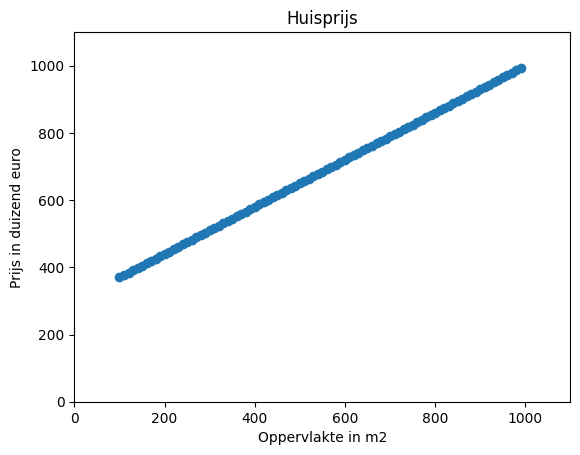

In [5]:
fig, ax = plt.subplots()

ax.set(xlim=[0, 1100], ylim=[0, 1100], xlabel='Oppervlakte in m2', ylabel='Prijs in duizend euro', title='Huisprijs')

plt.scatter(m2, price)
plt.show()

Let's add some randomness

In [6]:
# The answer to everything
rnd.seed(42)

# Mean
mu = 25

# Define standard deviation (spread)
sigma = 70

# Generate data
noisy_price = [m * x + b + rnd.gauss(mu, sigma) for x in m2]

# print(noisy_price)

And plot the results...

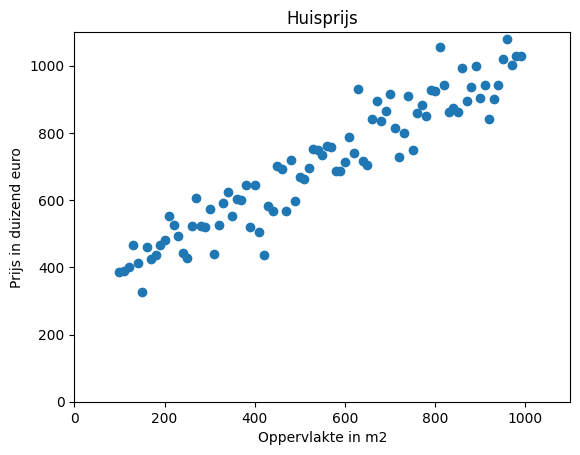

In [7]:
fig, ax = plt.subplots()

ax.set(xlim=[0, 1100], ylim=[0, 1100], xlabel='Oppervlakte in m2', ylabel='Prijs in duizend euro', title='Huisprijs')

plt.scatter(m2, noisy_price)
plt.show()

### Data

In [8]:
m2 = [100, 110, 120, 130, 140, 150, 160, 170, 180, 190, 200, 210, 220, 230, 240, 250, 260, 270, 280, 290, 300, 310, 320, 330, 340, 350, 360, 370, 380, 390, 400, 410, 420, 430, 440, 450, 460, 470, 480, 490, 500, 510, 520, 530, 540, 550, 560, 570, 580, 590, 600, 610, 620, 630, 640, 650, 660, 670, 680, 690, 700, 710, 720, 730, 740, 750, 760, 770, 780, 790, 800, 810, 820, 830, 840, 850, 860, 870, 880, 890, 900, 910, 920, 930, 940, 950, 960, 970, 980, 990]

In [9]:
prices = [384.91367692954503, 389.8967479767937, 401.20788969026364, 465.1388607569204, 414.0688201351979, 325.18526099613297, 460.2622840847401, 425.28637650519823, 435.81289210983635, 466.1119350690599, 481.26084158347044, 553.44910806194, 524.9645554759068, 493.73550242106825, 441.31748783586255, 428.9736342758598, 524.2439536647842, 605.7756579042834, 523.9159804732369, 520.5573694360451, 572.2243354280608, 440.25182913939256, 527.1405877998808, 590.3253772815467, 624.1383069765612, 553.1559229141405, 603.3619901081537, 601.374941452989, 645.7628766092549, 520.074445002628, 644.777548130977, 505.9835725792402, 435.60382044468037, 583.5176490260349, 568.8932967557804, 701.3208570139484, 693.4986129729026, 568.6647681093013, 720.31529963436, 597.8458023030355, 668.9629307564601, 661.4270155430428, 697.0093900222645, 753.3045418080637, 747.688965355471, 734.4919571308446, 762.4963668464409, 757.4944426355083, 687.111017434628, 687.7840234328396, 712.102220810479, 786.9528480333747, 741.4919100301831, 929.5027955736383, 715.6495220469454, 703.0787780068489, 840.7931460828787, 893.5294986940426, 836.3984883587482, 866.5072142177371, 914.8441484209513, 815.4180766788587, 729.3928746802716, 798.7546416176901, 909.7027030121603, 748.9425115745198, 859.3471924551083, 881.7266151539443, 848.9085484630431, 928.6542390457668, 925.6545819068597, 1054.4985961830512, 942.3977437441195, 863.3417578949857, 873.6741685366178, 861.7893229130596, 993.6591491871075, 894.321701563041, 936.0817458409582, 1000.4511833502772, 904.3575906544015, 941.4439425467597, 840.1099614077259, 900.2264966672901, 943.2584511465706, 1019.103269196167, 1080.5445290710309, 1002.7073230785402, 1029.2954995439861, 1029.7578557983063]

### Handmatig matchen
uitdaging: wie matcht het best?

In [10]:
def manualFit(m, b):
    fit = [m * x + b for x in m2]
    
    fig, ax = plt.subplots()

    ax.set(xlim=[0, 1100], ylim=[0, 1100], xlabel='Oppervlakte in m2', ylabel='Prijs in duizend euro', title='Huisprijs')
    
    plt.scatter(m2, prices)
    plt.plot(m2, fit, 'red')
    
    plt.show()
    
interact(manualFit, m=(-2,2,0.01), b=(-1000,1000))

interactive(children=(FloatSlider(value=0.0, description='m', max=2.0, min=-2.0, step=0.01), IntSlider(value=0…

<function __main__.manualFit(m, b)>

### Toevoegen error & loss

In [11]:
def error(actual, predicted):
    return actual - predicted

def loss(fit):
    l = 0
    # Sum of squared errors
    for i in range(0, len(m2)):
        err = error(prices[i], fit[i])
        l += (err**2)
    return math.sqrt(l / len(m2))

def manualFit(m, b):
    fit = [m * x + b for x in m2]
    
    fig, ax = plt.subplots()

    ax.set(xlim=[0, 1100], ylim=[0, 1100], xlabel='Oppervlakte in m2', ylabel='Prijs in duizend euro', title='Huisprijs')
    
    plt.scatter(m2, prices)
    plt.plot(m2, fit, 'red')
    
    plt.show()
    
    print(loss(fit))
    
interact(manualFit, m=(-2,2,0.01), b=(-1000,1000))

interactive(children=(FloatSlider(value=0.0, description='m', max=2.0, min=-2.0, step=0.01), IntSlider(value=0…

<function __main__.manualFit(m, b)>

### Automatiseren (machine learning)

initial loss:  732.9188985681157
epoch:  0
loss:  535.6090434533892
epoch:  1
loss:  397.96810162463566
epoch:  2
loss:  303.7147979919663
epoch:  3
loss:  241.0028651324855
epoch:  4
loss:  200.86961765695705
epoch:  5
loss:  176.28314521422894
epoch:  6
loss:  161.79220767509344
epoch:  7
loss:  153.45973615731498
epoch:  8
loss:  148.69884969337915
epoch:  9
loss:  145.94440115259192
epoch:  10
loss:  144.3012331370086
epoch:  11
loss:  143.27326374250978
epoch:  12
loss:  142.58915585567726
epoch:  13
loss:  142.1005540630996
epoch:  14
loss:  141.72564022132642
epoch:  15
loss:  141.41859208166915
epoch:  16
loss:  141.15321313346456
epoch:  17
loss:  140.91415687759783
epoch:  18
loss:  140.69218970528118
epoch:  19
loss:  140.4816020817975
epoch:  20
loss:  140.27876940937227
epoch:  21
loss:  140.08133482076772
epoch:  22
loss:  139.88773355650852
epoch:  23
loss:  139.69690860831548
epoch:  24
loss:  139.50813595201475
epoch:  25
loss:  139.32091421661153
epoch:  26
loss:  139

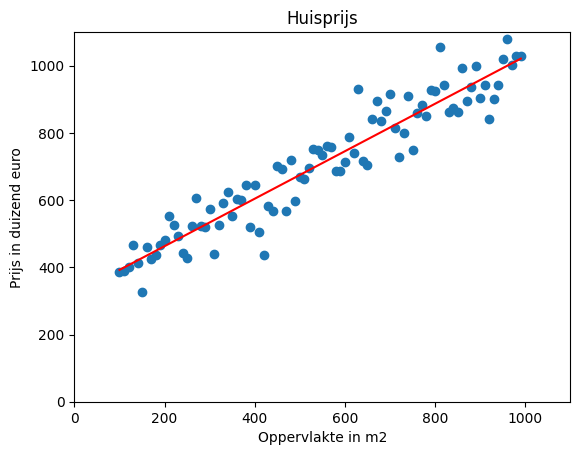

In [12]:
# Learning iterations
epochs = 50000

# Learning rate
learningRateM = 0.00000001
learningRateB = 0.0001

#------------------------------------------

# Initial values ("guess")
mFit = 0.0
bFit = 0.0

#------------------------------------------

def loss(m, b):
    
    l = 0
    
    # Sum of squared errors
    for i in range(0, len(m2)):
        
        guess = m * m2[i] + b
        err = prices[i] - guess
        
        l += (err**2)
    
    return math.sqrt(l / len(m2))

#------------------------------------------

def gradientDescent(m, b, i):
    
    guess = m * m2[i] + b
    err = prices[i] - guess

    # print("error: ", err)

    # Stochastic gradient descent
    m += err * learningRateM * m2[i]
    b += err * learningRateB

    # print("m: ", m, "b: ", b)
        
    return m, b
    
#------------------------------------------

def learn(m, b):
    
    for i in range(0, len(m2)):

        # Adjust m and b, given input price
        m, b = gradientDescent(m, b, i)
        
    return m, b

#------------------------------------------

def plotFit():
    
    fig, ax = plt.subplots()

    ax.set(xlim=[0, 1100], ylim=[0, 1100], xlabel='Oppervlakte in m2', ylabel='Prijs in duizend euro', title='Huisprijs')


    fit = [mFit * x + bFit for x in m2]

    plt.scatter(m2, prices)
    plt.plot(m2, fit, 'red')

    plt.show()

#------------------------------------------

epoch = 0

# Inital loss
l = loss(mFit, bFit)

print("initial loss: ", loss(mFit, bFit))

#------------------------------------------

while epoch < epochs:
    
    print("epoch: ", epoch)
    
    mFit, bFit = learn(mFit, bFit)
    
    print("loss: ", loss(mFit, bFit))
    
    epoch += 1
    
    
    
    # plotFit()
    
#------------------------------------------

print("mFit: ", mFit, "bFit: ", bFit)
print("final loss: ", loss(mFit, bFit))

plotFit()

# Deep Learning

### Preparation

In [13]:
def preparePlot(t):
    
    fig, ax = plt.subplots()
    ax.set(xlim=[-10, 10], ylim=[-50, 400], xlabel='x', ylabel='y', title=t)

def plotCurve(x, y, scatter):

    if scatter:
        plt.scatter(x, y)
    else:
        plt.plot(x, y, 'red')

def showPlot():
    
    plt.show()

In [14]:
x = [x for x in range(-10, 11, 1)]

print(x)

[-10, -9, -8, -7, -6, -5, -4, -3, -2, -1, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


In [15]:
a = 2
b = 3
c = -10

# Prepare random data
y = [a * x**2 + b * x + c for x in x]

# Mean
mu = 5

# Define standard deviation (spread)
sigma = 20

# Prepare random data
yNoise = [a * x**2 + b * x + c + rnd.gauss(mu, sigma) for x in x]

print(y)

[160, 125, 94, 67, 44, 25, 10, -1, -8, -11, -10, -5, 4, 17, 34, 55, 80, 109, 142, 179, 220]


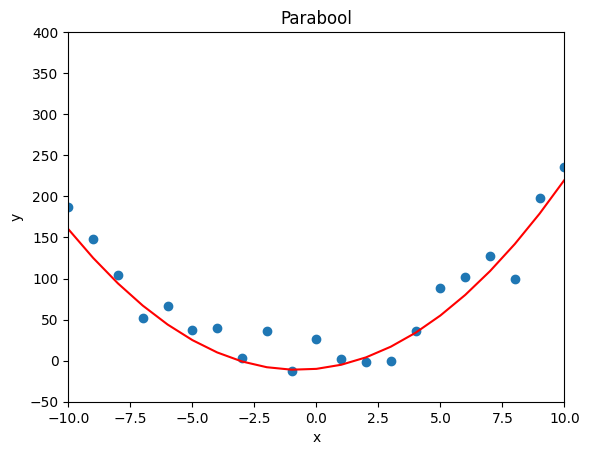

In [16]:
preparePlot("Parabool")
plotCurve(x,y, False)
plotCurve(x,yNoise, True)
showPlot()

## Doel: best fit maken

### ReLU: Rectified Linear Unit

In [17]:
def relu(m, b, x):
    
    y = m * x + b
    
    if y < 0:
        return 0
    else:
        return y

In [18]:
def manualRelu(m, b):
    
    rlu = [relu(m, b, x) for x in x]
    
    preparePlot("Relu")
    plotCurve(x, rlu, False)
    
interact(manualRelu, m=(-10,10,0.1), b=(-10,10,0.1))

interactive(children=(FloatSlider(value=0.0, description='m', max=10.0, min=-10.0), FloatSlider(value=0.0, des…

<function __main__.manualRelu(m, b)>

### Handmatige parabool fit met ReLU

In [19]:
def parabolaFit(m1, b1, m2, b2):
    
    fit = [relu(m1, b1, x) + relu(m2, b2, x) for x in x]
    
    preparePlot("Twee relu's")
    
    plotCurve(x, fit, False)
    plotCurve(x, yNoise, True)
    
    showPlot()

interact(parabolaFit, m1=(-50,50,0.01), b1=(-50,50,0.01), m2=(-50,50,0.01), b2=(-50,50,0.01))

interactive(children=(FloatSlider(value=0.0, description='m1', max=50.0, min=-50.0, step=0.01), FloatSlider(va…

<function __main__.parabolaFit(m1, b1, m2, b2)>

### Automatische parabool fit

initial loss:  92.81163720137685
epoch:  0
loss:  71.5438342771959
epoch:  1
loss:  65.19183798394725
epoch:  2
loss:  63.23896094789397
epoch:  3
loss:  62.57784964971173
epoch:  4
loss:  62.38149281752499
epoch:  5
loss:  62.369080242705344
epoch:  6
loss:  62.41540273606718
epoch:  7
loss:  62.487792463831276
epoch:  8
loss:  62.57388437672762
epoch:  9
loss:  62.65109368574574
epoch:  10
loss:  62.732968977096775
epoch:  11
loss:  62.823001081057136
epoch:  12
loss:  62.91027279653265
epoch:  13
loss:  62.97988233976142
epoch:  14
loss:  63.030112763367306
epoch:  15
loss:  63.05405715052888
epoch:  16
loss:  63.028439657458605
epoch:  17
loss:  62.908418786086784
epoch:  18
loss:  62.62308128232205
epoch:  19
loss:  62.06900351123692
epoch:  20
loss:  61.51230305393287
epoch:  21
loss:  60.98761929839465
epoch:  22
loss:  60.491676805280406
epoch:  23
loss:  60.022192371566646
epoch:  24
loss:  59.577252581456726
epoch:  25
loss:  59.1558538764954
epoch:  26
loss:  58.757213324644

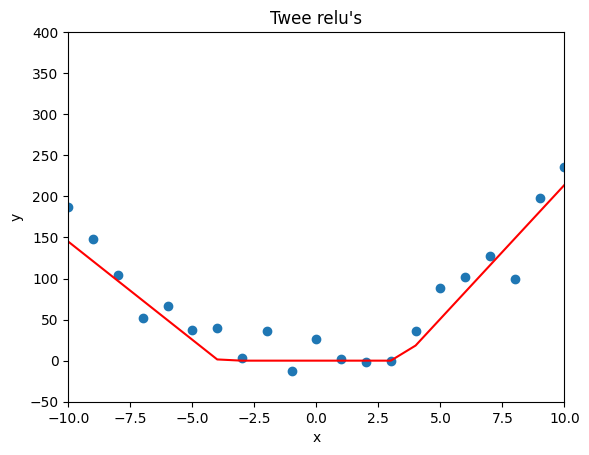

In [22]:
# Learning iterations
epochs = 225000

# Learning rate
learningRate = 0.001

#------------------------------------------

# Initial values ("guess")
m1Fit = 0.0
b1Fit = 0.0
m2Fit = 0.0
b2Fit = 0.0

#------------------------------------------

def loss(m1, b1, m2, b2):
    
    l = 0
    
    # Sum of squared errors
    for i in range(0, len(x)):
        
        guess = relu(m1, b1, x[i]) + relu(m2, b2, x[i])
        err = y[i] - guess
        
        l += (err**2)
    
    return math.sqrt(l / len(x))

#------------------------------------------

def gradientDescent(m1, b1, m2, b2, i):
    
    # First guess
    guess1 = relu(m1, b1, x[i]) + relu(m2, b2, x[i])
    err1 = y[i] - guess1

    # print("error: ", err)

    # Stochastic gradient descent
    m1 += err1 * learningRate * x[i]
    b1 += err1 * learningRate
    
    # Second guess
    guess2 = relu(m1, b1, x[i]) + relu(m2, b2, x[i])
    err2 = y[i] - guess2

    # print("error: ", err)

    # Stochastic gradient descent
    m2 += err2 * learningRate * x[i]
    b2 += err2 * learningRate

    # print("m: ", m, "b: ", b)
        
    return m1, b1, m2, b2
    
#------------------------------------------

def learn(m1, b1, m2, b2):
    
    for i in range(0, len(x)):

        # Adjust m and b, given input
        m1, b1, m2, b2 = gradientDescent(m1, b1, m2, b2, i)
        
    return m1, b1, m2, b2

#------------------------------------------

epoch = 0

# Inital loss
l = loss(m1Fit, b1Fit, m2Fit, b2Fit)

print("initial loss: ", loss(m1Fit, b1Fit, m2Fit, b2Fit))

#------------------------------------------

while epoch < epochs:
    
    print("epoch: ", epoch)
    
    m1Fit, b1Fit, m2Fit, b2Fit = learn(m1Fit, b1Fit, m2Fit, b2Fit)
    
    print("loss: ", loss(m1Fit, b1Fit, m2Fit, b2Fit))
    
    epoch += 1
    

    
    # plotFit()
    
#------------------------------------------

print("m1Fit: ", m1Fit, "b1Fit: ", b1Fit, "m2Fit: ", m2Fit, "b2Fit: ", b2Fit)
print("final loss: ", loss(m1Fit, b1Fit, m2Fit, b2Fit))

parabolaFit(m1Fit, b1Fit, m2Fit, b2Fit)